<a href="https://colab.research.google.com/github/MDC55/Harvard-Forest-Classification/blob/main/HF_1m_1DCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Library for common functions
# Kedar Patki
# %matplotlib qt
# TODO:
#https://www.spectralpython.net/class_func_ref.html
#https://stackoverflow.com/questions/59630622/how-to-enable-zoom-in-out-and-zoom-to-percentage-buttons-in-plots-pane-in-spyder
#-----------------------------------------------------------------------------------------
!pip install spectral


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 3.1 MB/s eta 0:00:00


In [ ]:
from spectral import *
import numpy as np
import spectral.io.envi as envi
import matplotlib.pyplot as plt
# import pdb

In [ ]:
#-----------------------------------------------------------------------------------------
def open_envi_image( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    img = img_envi.load()
    return img

def open_envi_gt_image( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    img = img_envi.load()
    header_file = envi.read_envi_header(hsi_hdr_file)
    print(header_file)
    #print(header_file['bands'])
    return img,header_file



#img2=open_image(hsi_hdr_file).read_band(7)

def wavelength( data_dir, basename ):
    hsi_hdr_file = data_dir + '/' + '{}.img.hdr'.format( basename )
    hsi_img_file = data_dir + '/' + '{}.img'.format( basename )
    img_envi = envi.open( hsi_hdr_file, hsi_img_file )
    wavelength= img_envi.bands.centers
    bands=img_envi.bands
    return wavelength

def view_hsi_image_color(hsi_img):
    hsi_img_b=hsi_img[:,:,14]
    hsi_img_b_normalized=hsi_img_b/np.max(hsi_img_b)

    hsi_img_g=hsi_img[:,:,30]
    hsi_img_g_normalized=hsi_img_g/np.max(hsi_img_g)

    hsi_img_r=hsi_img[:,:,48]
    hsi_img_r_normalized=hsi_img_r/np.max(hsi_img_r)

    image=np.asarray(255*np.concatenate([hsi_img_b_normalized,
                                         hsi_img_g_normalized,
                                         hsi_img_r_normalized],axis=2),dtype=np.uint8)
    plt.imshow(image)
    plt.show()
    return image

def get_reflectance_image( input_radiance_img,img_with_cal_panel ):

    # Get ground-truth reflectance data
    # gt_reflectance_vec_calpanel_80 = 0.80 * np.ones( 224 )
    # gt_reflectance_vec_calpanel_20 = 0.20 * np.ones( 224 )


    # Interpolate and find ground-truth reflectance values at wavelengths of the hsi cube
    # hsi_wavelength_vec = np.array( input_radiance_img.bands.centers )

    # Manually selected cal panel pixels for 2 cal panels at 80% and 20%
    r1_calpanel_80, c1_calpanel_80 = 406, 595
    r2_calpanel_80, c2_calpanel_80 = 408, 590


    r1_calpanel_20, c1_calpanel_20 = 431, 105
    r2_calpanel_20, c2_calpanel_20 = 436, 107

    # Compute average of the pixels i.e. radiance vectors for each panel
    avg_calpanel_80_radiance_vec = ( img_with_cal_panel[r1_calpanel_80,c1_calpanel_80,:] +
                                    img_with_cal_panel[r2_calpanel_80,c2_calpanel_80,:] ) / 2

    avg_calpanel_20_radiance_vec = ( img_with_cal_panel[r1_calpanel_20,c1_calpanel_20,:] +
                                    img_with_cal_panel[r2_calpanel_20,c2_calpanel_20,:] ) / 2

    # Compute gain and offset ( a and b ) vectors
    # R=radiance, r=reflectance
    # using R = a*r + b per wavelength, and r = ( R - b ) / a
    # so, a = (R2-R1) / (r2-r1), b = (R1*r2 - R2*r1) / (r2-r1)
    a_vec = ( avg_calpanel_80_radiance_vec - avg_calpanel_20_radiance_vec ) / ( 0.8 - 0.2 )
    b_vec = ( avg_calpanel_20_radiance_vec * 0.8 - avg_calpanel_80_radiance_vec * 0.2 ) / ( 0.8 - 0.2 )

    # Create compensated hsi image i.e. reflectance image
    # reflectance_img_compensated = ( radiance_img - b_vec ) / a_vec
    reflectance_img = ( input_radiance_img - b_vec ) / a_vec

    # save image
    # envi.save_image( '../generated_images/{}_refl.img.hdr'.format( rootname ), reflectance_img )
    return reflectance_img



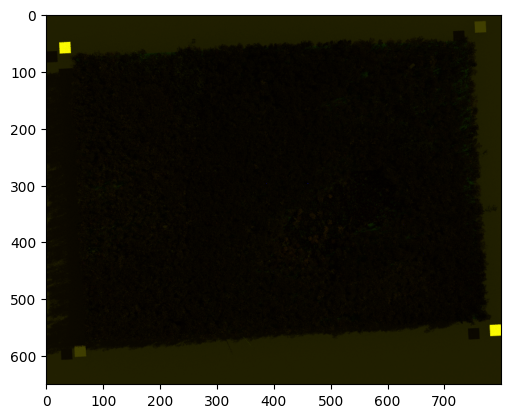

<ipython-input-4-2130fd5417cf>:82: RuntimeWarning: invalid value encountered in divide
  reflectance_img = ( input_radiance_img - b_vec ) / a_vec


In [ ]:
#%%-------------------------------------------------------------------------------
data_dir='/content/drive/MyDrive/My Computer/Drive F/HarvardForestV3/1.5m_GSD'
basename='aviris'
img_with_cal_panel=open_envi_image(data_dir,basename)

data_dir='/content/drive/MyDrive/My Computer/Drive F/HarvardForestV3/1m_GSD_800by650'
basename='aviris'
img_rad=open_envi_image(data_dir,basename)

view_hsi_image_color(img_rad)

img_ref=get_reflectance_image(img_rad,img_with_cal_panel)
wl=wavelength(data_dir,basename)


Text(0, 0.5, 'y')

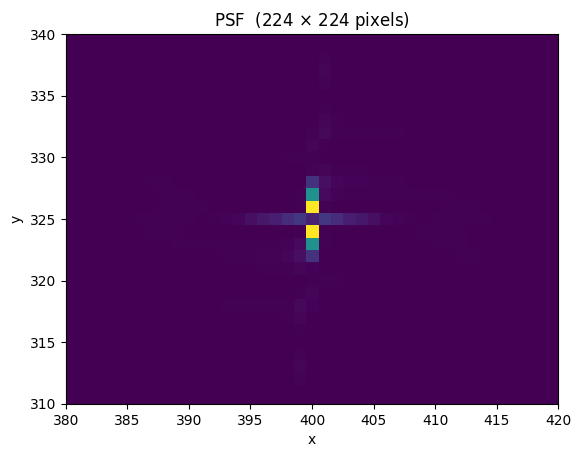

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
E1 = np.fft.fftshift(img_ref[:,:,1])
E11 = np.fft.fft2(E1)
E111 = np.fft.fftshift(E11)

PSF1 = np.abs(E111)**2

plt.figure()
plt.imshow(PSF1,cmap='viridis')
plt.title(r"PSF  (224 $\times$ 224 pixels)")
plt.xlim((380,420))
plt.ylim((310,340))
plt.xlabel('x')
plt.ylabel('y')

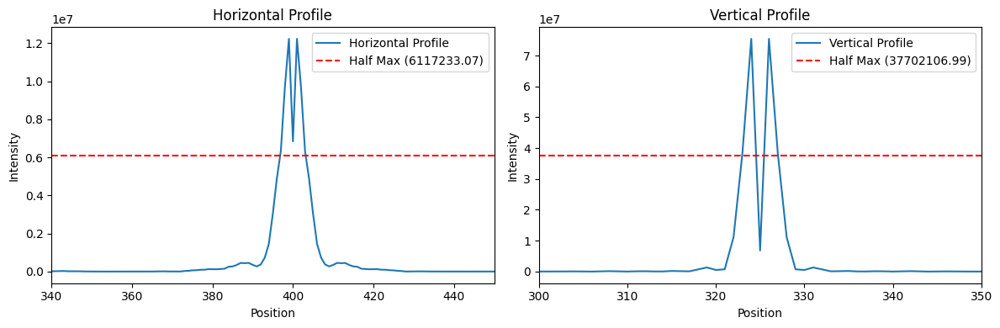

Horizontal FWHM: 7
Vertical FWHM: 4


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have already computed the PSF and stored it in the variable 'PSF'

# Define a function to compute FWHM and plot profiles
def calculate_FWHM(psf):
    # Compute the 1D horizontal and vertical profiles
    horizontal_profile = psf[int(psf.shape[0] / 2), :]
    vertical_profile = psf[:, int(psf.shape[1] / 2)]

    # Find the FWHM in the horizontal profile
    half_max_h = max(horizontal_profile) / 2
    above_half_max_h = horizontal_profile > half_max_h
    fwhm_h = np.sum(above_half_max_h)

    # Find the FWHM in the vertical profile
    half_max_v = max(vertical_profile) / 2
    above_half_max_v = vertical_profile > half_max_v
    fwhm_v = np.sum(above_half_max_v)

    # Plot the horizontal and vertical profiles
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(horizontal_profile, label="Horizontal Profile")
    plt.axhline(half_max_h, color='r', linestyle='--', label=f'Half Max ({half_max_h:.2f})')
    plt.xlabel('Position')
    plt.ylabel('Intensity')
    plt.xlim ([340, 450])
    plt.title('Horizontal Profile')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(vertical_profile, label="Vertical Profile")
    plt.axhline(half_max_v, color='r', linestyle='--', label=f'Half Max ({half_max_v:.2f})')
    plt.xlim ([300,350])
    plt.xlabel('Position')
    plt.ylabel('Intensity')
    plt.title('Vertical Profile')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return fwhm_h, fwhm_v

# Calculate FWHM and plot profiles
fwhm_horizontal, fwhm_vertical = calculate_FWHM(PSF1)

# Print the results
print(f"Horizontal FWHM: {fwhm_horizontal}")
print(f"Vertical FWHM: {fwhm_vertical}")

{'description': "Truth data generated by DIRSIG 2023.25 (5452a91) 'BasicPlatform' plugin", 'samples': '800', 'lines': '650', 'bands': '9', 'header offset': '0', 'data type': '5', 'interleave': 'BIP', 'byte order': '0', 'band names': ['X Hit Coordinate [m]', 'Y Hit Coordinate [m]', 'Z Hit Coordinate [m]', 'Distance [m]', 'View Angle Cosine []', 'U Texture Coordinate []', 'V Texture Coordinate []', 'Dominant Material Index', 'Dominant Optical Property Index']}


Text(0.5, 1.0, 'Ground Truth')

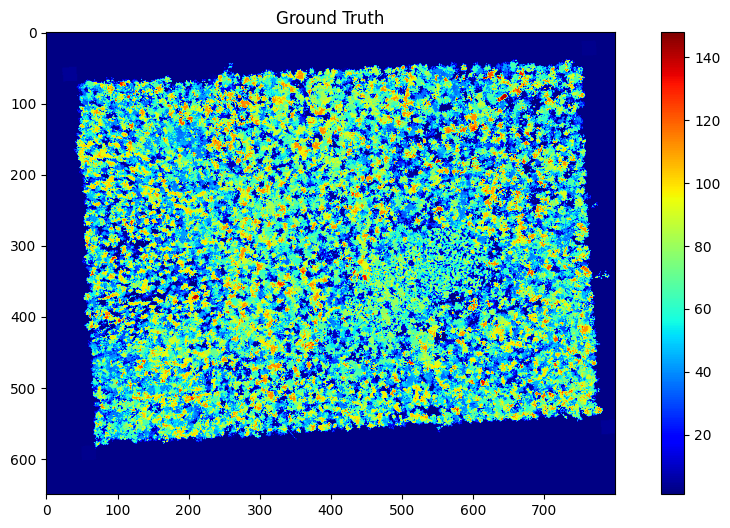

In [ ]:
#%% Ground Truth Labelled Image
#data_dir="F:/HarvardForestV3/2m_GSD"
data_dir='/content/drive/MyDrive/My Computer/Drive F/HarvardForestV3/1m_GSD_800by650'
basename='aviris_truth'
#you can read the header into a Dictionary and then access the bands:
    #https://docs.python.org/3/tutorial/datastructures.html#dictionaries

truth_img,header_file=open_envi_gt_image(data_dir,basename)


from spectral import*
Labelled_data=truth_img.read_bands(7)

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(Labelled_data, cmap='jet')
plt.colorbar()
#plt.axis('off')
plt.title('Ground Truth')

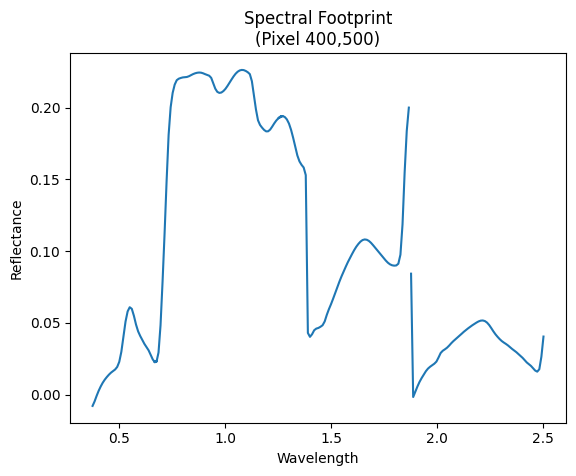

In [ ]:
#%% https://eufat.github.io/2019/02/19/hyperspectral-image-preprocessing-with-python.html

#Using selected pixel by defining its coordinae we can call the pixel vector from above
#corrected hyperspectral tensor. Then we squeeze to acquire un-arrayed elements of vector.
#At last, we could plot its spectral footprint.
leaf_pixel_y = 500
leaf_pixel_x = 400

leaf_pixel = img_ref[
    leaf_pixel_y:leaf_pixel_y+1,
    leaf_pixel_x:leaf_pixel_x+1,
    :]

leaf_pixel_squeezed = np.squeeze(leaf_pixel)

plt.plot(wl, leaf_pixel_squeezed)
plt.title('Spectral Footprint\n(Pixel {},{})'.format(
    leaf_pixel_x, leaf_pixel_y))
plt.xlabel('Wavelength')
plt.ylabel('Reflectance')
plt.show()


Text(0.5, 1.0, 'band - 7')

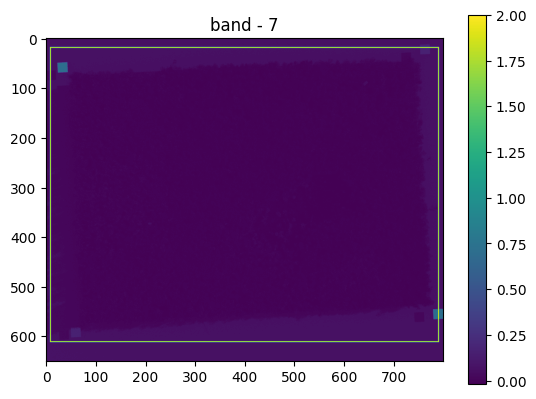

In [ ]:
#%%
def extract_rois(arr, x, y, w, h, intensity, line):
    roi = arr[y:y+h, x:x+w, :]

    bounding_box = arr
    bounding_box[y-line:y, x-line:x+w+line, :] = intensity # top line
    bounding_box[y:y+h, x-line:x, :] = intensity # left line
    bounding_box[y+h:y+h+line, x-line:x+w+line, :] = intensity # bottom line
    bounding_box[y:y+h, x+w:x+w+line, :] = intensity # right line

    return (roi, bounding_box)

coordinates = [
    (10, 20) #(x=horizontal,y=vertical)
]

rois = [] # returned ROIs
width = 780# width and height
height = 590 # width and height
line = 2 # bounding box line width
intensity = 2 # bounding box line intensity
image_bboxed = None

#extract roi for test image
for coordinate in coordinates:
    (x, y) = coordinate
    (roi, image_bboxed) = extract_rois(
        img_ref, x, y, width, height, intensity, line)
    rois.append(roi)


# imshow(image_bboxed, (100, 100, 5))
# imshow(image_bboxed[:, :, 5])


sns.axes_style('whitegrid')
#fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(image_bboxed[:, :, q])
plt.colorbar()
#plt.axis('off')
plt.title(f'band - {q}')

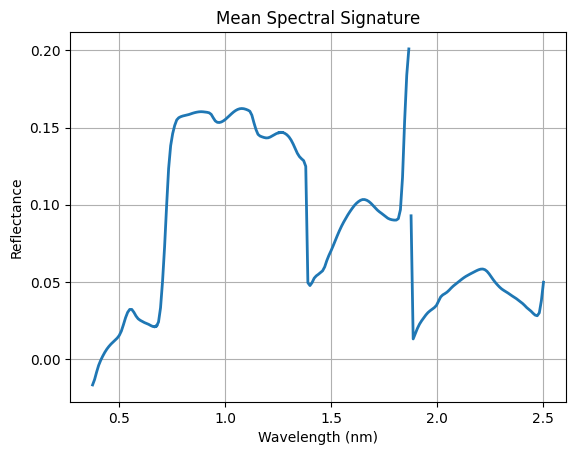

In [ ]:
#%%
for i in range(len(rois)):
    roi = rois[i]
    intensity = []
    for b in range(roi.shape[2]):
        intensity.append(np.mean(roi[:, :, b]))
    #plt.plot(wl, intensity, label='ROI {}'.format(i+1))
    plt.plot(wl, intensity,linewidth=2)

#plt.legend(loc='upper left')
#plt.title('Spectral Footprint\n Mean in ROI Area')
#plt.rcParams.update({'font.size': 16})
plt.title('Mean Spectral Signature')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.grid()
plt.savefig('Mean Spectral Signature.png', dpi=200)
plt.show()



Text(0.5, 1.0, 'band - 7')

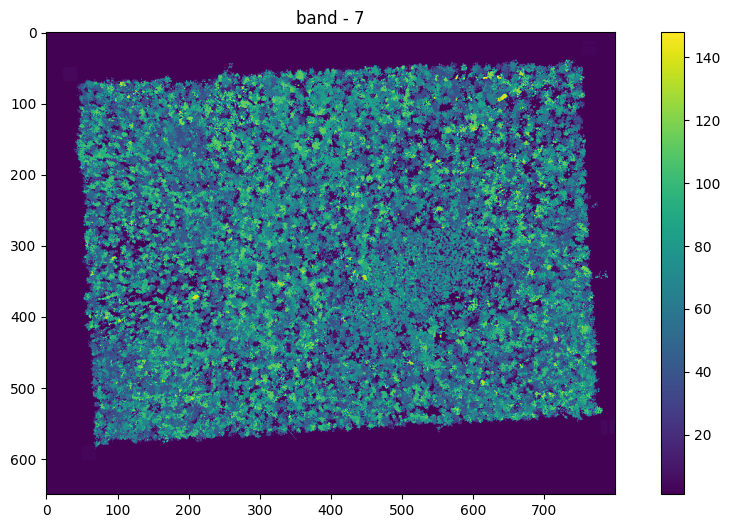

In [ ]:
#%%
#extract same roi for ground truth image
rois_gt = [] # returned ROIs
width = 780# width and height
height = 590 # width and height
line = 2 # bounding box line width
intensity = 2 # bounding box line intensity
image_bboxed = None


for coordinate in coordinates:
    (x, y) = coordinate
    (roi_gt, image_bboxed) = extract_rois(
        truth_img, x, y, width, height, intensity, line)
    rois_gt.append(roi_gt)

from spectral import*
Labelled_data_roi=roi_gt.read_bands(7)

# imshow(image_bboxed, (100, 100, 5))
# imshow(image_bboxed[:, :, 5])

sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(image_bboxed[:, :, q])
plt.colorbar()
#plt.axis('off')
plt.title(f'band - {q}')

In [ ]:
#%% combining 'acerpe':[82,9,81,63,53],'acerru':[34,40,71,45,39,70] into acer
#    'betual':[133,77,64,88,22],'betule':[113,93,68,27,42],'betupa':[89],'betupo':[47,121,119,78] into betu
#    'pinure':[37,104,110,15],'pinust':[131,102,28,76,46,33], into pinu
#    'queral':[69,36,120,16,49,25],'querru':[67,112,92,61,5,83,26,80,66,8,79,7], into quer

speciesToID = {
    'acer':[82,9,81,63,53,34,40,71,45,39,70],
    'aronme':[54,98,132,108],
    'bark':[65,62,117,135],
    'betu':[133,77,64,88,22,113,93,68,27,42,89,47,121,119,78],
    'castde':[116,14,115,51,50],
    'dead':[17,59,38,60,35,130],
    'fagugr':[123,72,57,96,18],
    'fraxni':[122],
    'hamavi':[74,12,85,55,75],
    'ilexve':[32,73,95,107,56],
    'kalmla':[20],
    'larila':[84],
    'lyonli':[127,124,105,129,126],
    'nemomu':[21,13,86,29,118],
    'nysssy':[6],
    'ostrvi':[94],
    'piceab':[114],
    'pinu':[37,104,110,15,131,102,28,76,46,33],
    'quer':[69,36,120,16,49,25,67,112,92,61,5,83,26,80,66,8,79,7],
    'rhodpr':[11,99,109],
    'soil':[19,128,23,31],
    'tsugca':[52,43,30,103,97,100],
    'ulmuam':[134],
    'vaccco':[44,91,125,48,90,10,41,111],
    'vibual':[58,106,101,24,87]
}

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


(-0.5, 779.5, 589.5, -0.5)

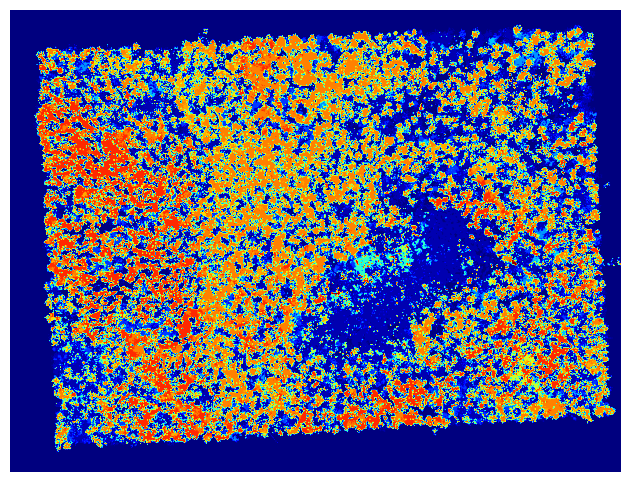

In [ ]:
#%%https://stackoverflow.com/questions/67761919/how-to-apply-a-lookup-to-a-label-image-with-more-than-256-labels
#https://realpython.com/iterate-through-dictionary-python/
# Create empty label array
labelArray = np.zeros_like(Labelled_data_roi)
labelsToSpecies = {}
# Create labels
# label = 1
# for species in speciesToID:
#     for value in speciesToID[species]:
#         indices = np.where(Labelled_data_roi == value)
#         labelArray[indices] = label
#         if label not in labelsToSpecies:
#             labelsToSpecies[label] = [species]
#     label += 1

label = 1
for species in speciesToID:
    for value in speciesToID[species]:
        # Find all locations where the value exists in the imgArray
        indices = np.where(Labelled_data_roi == value)
        labelArray[indices] = label
        if label not in labelsToSpecies:
            labelsToSpecies[label] = [species]
    label += 1  if len(indices[0]) > 0 and all(Labelled_data_roi[indices] == value) else 0

print(labelArray)

sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

#q = np.random.randint(data.shape[2])
q=7
plt.imshow(labelArray, cmap='jet')
#plt.colorbar()
plt.axis('off')
#plt.title('Ground Truth')



In [ ]:
#%% Extracting pixels using ROI of the HSI
#from untitled0-copy.py... F:\Codes from Other Projects\HSI Image classification Code Practice
X=roi
#y=Labelled_data_roi #ROI of the ground truth image
y=labelArray #modified labelled ground truth data
import pandas as pd
def extract_pixels(X, y,save_name):
  q = X.reshape(-1, X.shape[2]) #z.reshape(-1):It simply means that it is an unknown dimension and we want numpy to figure it out
  image_nan_removed=np.where(np.isnan(q), 0, q)
  df = pd.DataFrame(data = image_nan_removed)
  df = pd.concat([df, pd.DataFrame(data = y.ravel())], axis=1) #axis 1=column
  df.columns= [f'band{i}' for i in range(1, 1+X.shape[2])]+['class']
  #df.to_csv(f'{save_name}.csv', index=False)
  return df

#I have 341504 rows and 224 column in the df
df = extract_pixels(X, y,save_name='hvd1')
df.head()
#[:, :] literally means [all rows, all columns]
#Indexing in python starts from 0 when you go from the first element to the last, but it starts from -1 when you start from the last element.
#So, when you do [:, -1] it means you are taking all the rows and only the last column. -1 represents the last column
#When you do [:, :-1], it means you are taking all the rows and all the columns except the last column.
df.iloc[:, :-1].describe()
null_sum=df.isnull().sum()


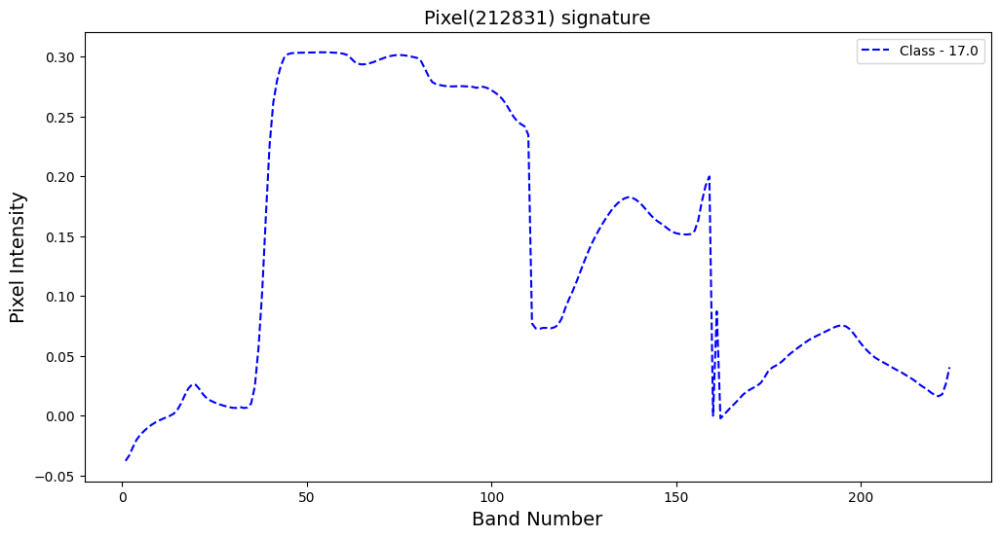

In [ ]:
#%% Visualizing spectral signature
def plot_signature(df):
    plt.figure(figsize=(12, 6))
    pixel_no = np.random.randint(df.shape[0])
    plt.plot(range(1, 225), df.iloc[pixel_no, :-1].values.tolist(), 'b--', label= f'Class - {df.iloc[pixel_no, -1]}')
    plt.legend()
    plt.title(f'Pixel({pixel_no}) signature', fontsize=14)
    plt.xlabel('Band Number', fontsize=14)
    plt.ylabel('Pixel Intensity', fontsize=14)
    plt.show()

plot_signature(df)



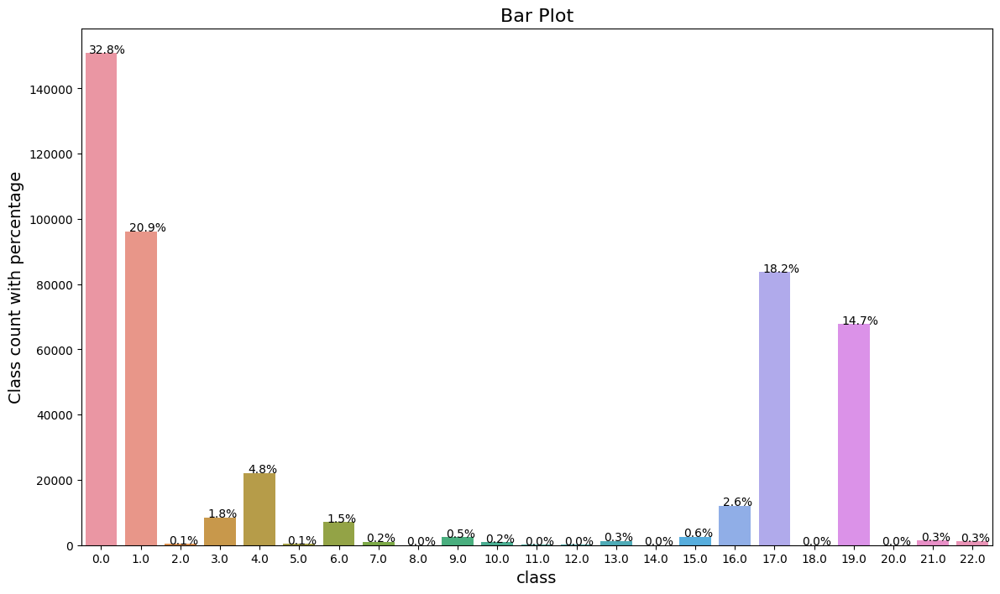

In [ ]:
#%%
#https://www.geeksforgeeks.org/how-to-annotate-bars-in-barplot-with-matplotlib-in-python/
plt.figure(figsize=(14, 8))
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picke
ax = sns.countplot(x='class', data=df[['class']])

  # Iterating over the bars one-by-one
  # passing the coordinates where the annotation shall be done
  # x-coordinate: p.get_x() + p.get_width() / 2
  # y-coordinate: p.get_height()
for p in ax.patches:
        ax.annotate('{:.1f}%'.format(100*p.get_height()/df.shape[0]), (p.get_x()+0.1, p.get_height()+5))

plt.ylabel('Class count with percentage', fontsize=14)
plt.xlabel('class', fontsize=14)
plt.title('Bar Plot', fontsize=16)
plt.show()


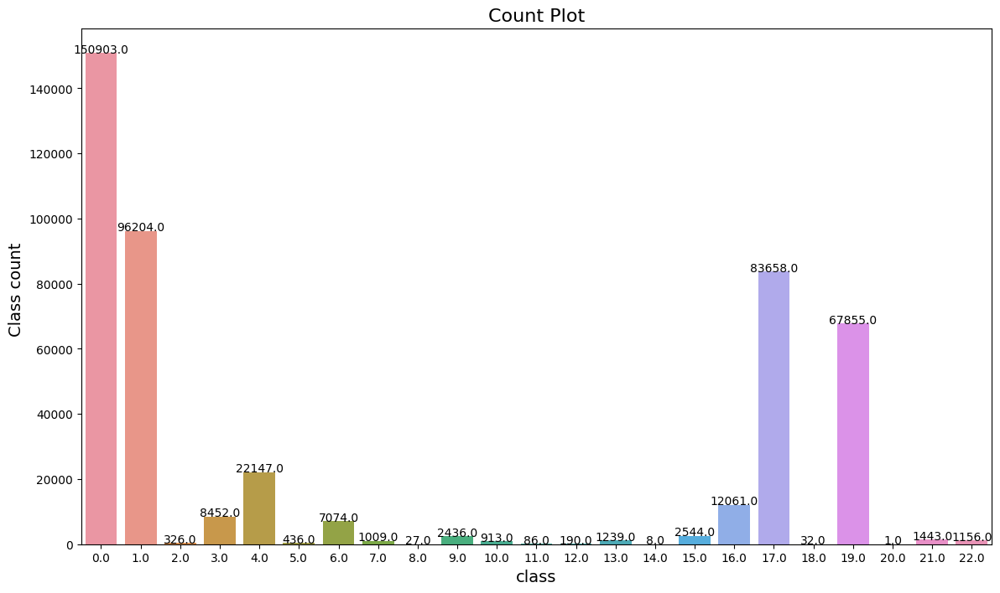

In [ ]:
#https://stackoverflow.com/questions/55104819/display-count-on-top-of-seaborn-barplot
plt.figure(figsize=(14, 8))
ax = sns.countplot(x='class', data=df[['class']])
# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picke
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")
plt.ylabel('Class count ', fontsize=14)
plt.xlabel('class', fontsize=14)
plt.title('Count Plot', fontsize=16)
plt.show()


Enter the band Number(1-224) :8


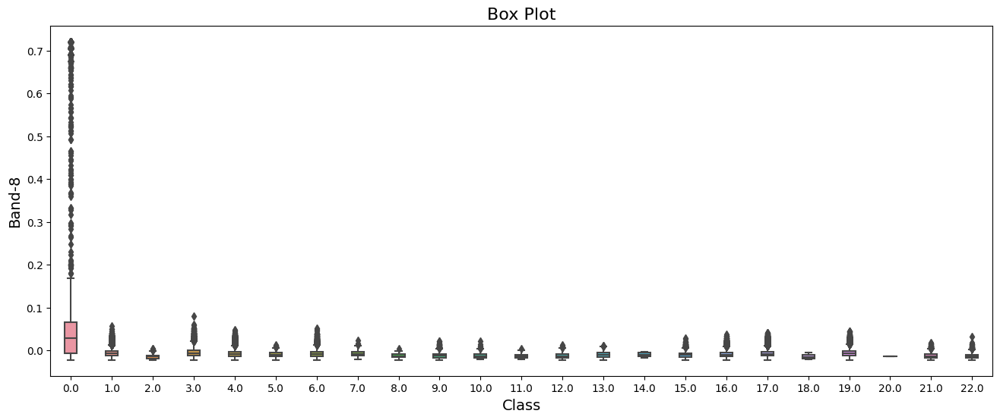

In [ ]:
#%% Box plot w.r.t bands of the HSI


plt.figure(figsize=(16, 6))
n = int(input('Enter the band Number(1-224) :'))
sns.boxplot( x=df["class"], y=df[f"band{n}"], width=0.3);
plt.title('Box Plot', fontsize= 16)
plt.xlabel('Class', fontsize= 14)
plt.ylabel(f'Band-{n}', fontsize= 14)
plt.show()


Details of Band-8: 

count    460200.000000
mean          0.006604
std           0.037069
min          -0.021880
25%          -0.011628
50%          -0.005250
75%           0.007866
max           0.721252
Name: band8, dtype: float64


<ipython-input-24-c4950d3c6fb1>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['band'+str(n)], color='mediumSpringGreen', bins=100, hist_kws={'alpha': 0.4});


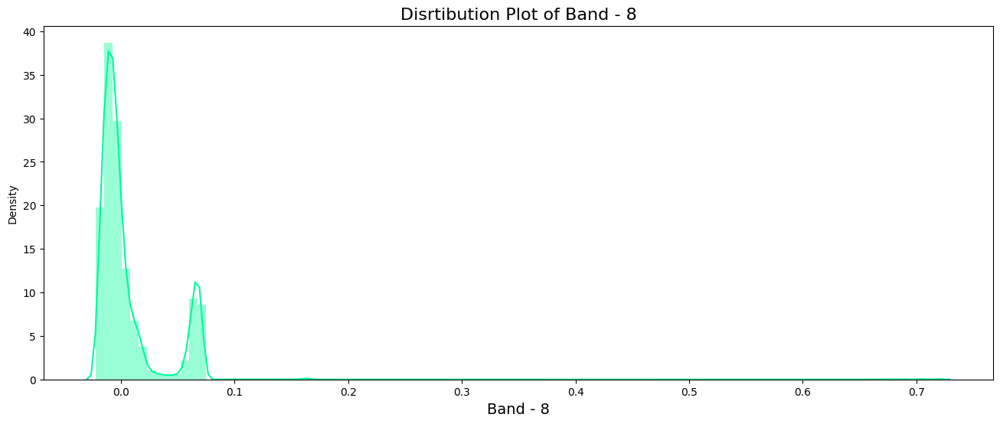

In [ ]:
#%% 6. Distribution Plot
print(f"Details of Band-{n}: \n\n{df['band'+str(n)].describe()}")
plt.figure(figsize=(16, 6))
sns.distplot(df['band'+str(n)], color='mediumSpringGreen', bins=100, hist_kws={'alpha': 0.4});
plt.xlabel('Band - '+str(n), fontsize=14)
plt.title('Disrtibution Plot of Band - '+str(n), fontsize=16)
plt.show()

#give band 8


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Conv1D, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

Scaling Data

In [ ]:
# from sklearn.preprocessing import minmax_scale
# X = df.iloc[:, :-1].values
# y = df.iloc[:, -1].values
# X.shape, y.shape
# X_scaled = minmax_scale(X, axis = 0);
# y = to_categorical(df.loc[:, 'class'])
# X_scaled.shape, y.shape

In [ ]:
df1 = df[df['class']!=0]
df1 = df1.groupby('class').filter(lambda x: len(x) >= 2) #to drop the rows that have only two samples
ind = ['band'+str(i) for i in range(1, df1.shape[-1])]

X = df1.loc[:, ind]
y = to_categorical(df1.loc[:, 'class']) ##one-hot encode target co
X.shape, y.shape


((309296, 224), (309296, 23))

Stratified Sampling — We create homogeneous subgroups called strata from the overall population and sample the right number of instances to each stratum to ensure that the test set is representative of the overall population.

In [ ]:
#%%

from sklearn.model_selection import train_test_split

#Dividing the reduced data into train and test
X_train, X_test, y_train, y_test, indices_train, indices_test  = train_test_split(X, y, range(X.shape[0]),  stratify=y,
                                                                                  test_size = 0.30, random_state = 11)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}")


X_train: (216507, 224)
y_train: (216507, 23)
X_test: (92789, 224)
y_test: (92789, 23)


In [ ]:
X_train

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band215,band216,band217,band218,band219,band220,band221,band222,band223,band224
202154,-0.039965,-0.037092,-0.033091,-0.029158,-0.025722,-0.022634,-0.019779,-0.017357,-0.015405,-0.013748,...,0.001349,0.000942,0.000758,0.000638,0.000429,0.000294,0.000982,0.004832,0.017417,0.037008
389790,-0.047729,-0.043359,-0.037362,-0.032000,-0.027951,-0.024521,-0.021339,-0.018627,-0.016448,-0.014596,...,0.008368,0.007546,0.006880,0.006209,0.005281,0.004348,0.004103,0.006854,0.018342,0.037204
49095,-0.044912,-0.040471,-0.033427,-0.026937,-0.022602,-0.019374,-0.016480,-0.014023,-0.012032,-0.010315,...,0.024682,0.022784,0.021194,0.019598,0.017640,0.016002,0.015296,0.017174,0.026117,0.040387
316763,-0.022876,-0.020713,-0.017549,-0.014334,-0.011470,-0.008879,-0.006489,-0.004320,-0.002275,-0.000334,...,0.018156,0.017623,0.017181,0.016698,0.016025,0.015386,0.015257,0.017472,0.026521,0.040604
424639,-0.018221,-0.015648,-0.012324,-0.009278,-0.006746,-0.004461,-0.002281,-0.000397,0.001119,0.002384,...,0.021824,0.020623,0.019595,0.018518,0.017129,0.015916,0.015444,0.017446,0.026395,0.040522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415272,-0.019274,-0.016507,-0.012875,-0.009521,-0.006776,-0.004379,-0.002171,-0.000282,0.001283,0.002663,...,0.039457,0.036960,0.034911,0.032973,0.030662,0.028741,0.027891,0.029241,0.035605,0.044435
247367,-0.017225,-0.014576,-0.010800,-0.007016,-0.003685,-0.000695,0.002048,0.004405,0.006439,0.008290,...,0.035466,0.034541,0.033776,0.033026,0.032096,0.031290,0.031071,0.032617,0.038394,0.045651
207645,-0.023518,-0.020506,-0.016420,-0.012421,-0.008848,-0.005625,-0.002715,-0.000245,0.001811,0.003561,...,0.018324,0.016948,0.015879,0.014752,0.013216,0.011811,0.011203,0.013322,0.023174,0.039180
207776,-0.038731,-0.034843,-0.030012,-0.025702,-0.022108,-0.018839,-0.015738,-0.013076,-0.010932,-0.009127,...,0.008144,0.007465,0.006907,0.006317,0.005449,0.004538,0.004274,0.006975,0.018401,0.037217


In [ ]:
X_test

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band215,band216,band217,band218,band219,band220,band221,band222,band223,band224
54876,-0.028799,-0.025480,-0.021277,-0.017407,-0.014065,-0.010955,-0.007998,-0.005439,-0.003326,-0.001529,...,0.015379,0.014381,0.013555,0.012621,0.011338,0.010263,0.010065,0.012632,0.022881,0.039122
238034,-0.010755,-0.008140,-0.004554,-0.001019,0.002143,0.004925,0.007209,0.009027,0.010656,0.012123,...,0.036941,0.034598,0.032842,0.031228,0.029228,0.027506,0.026733,0.028128,0.034704,0.044036
75485,-0.035098,-0.030440,-0.023446,-0.017272,-0.013244,-0.010230,-0.007527,-0.005180,-0.003178,-0.001386,...,0.039251,0.037100,0.035397,0.033849,0.032059,0.030606,0.030055,0.031493,0.037458,0.045243
377128,-0.029272,-0.025814,-0.021529,-0.017734,-0.014666,-0.011967,-0.009457,-0.007316,-0.005569,-0.004042,...,0.025374,0.023855,0.022537,0.021163,0.019434,0.017940,0.017237,0.018954,0.027434,0.040919
333956,-0.028351,-0.025823,-0.022196,-0.018594,-0.015478,-0.012704,-0.010177,-0.008037,-0.006250,-0.004667,...,0.030015,0.028001,0.026381,0.024902,0.023204,0.021834,0.021390,0.023346,0.031246,0.042687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115542,-0.031407,-0.028766,-0.024826,-0.020699,-0.016911,-0.013477,-0.010357,-0.007718,-0.005562,-0.003740,...,0.011356,0.010485,0.009852,0.009128,0.007974,0.006751,0.006133,0.008327,0.019112,0.037395
323571,-0.037041,-0.032121,-0.024986,-0.018773,-0.014524,-0.011083,-0.007814,-0.004934,-0.002580,-0.000617,...,0.035301,0.033129,0.031328,0.029573,0.027491,0.025855,0.025278,0.026946,0.033925,0.043754
354078,-0.043115,-0.038418,-0.031307,-0.025120,-0.021146,-0.018186,-0.015529,-0.013142,-0.010944,-0.008888,...,0.007563,0.006868,0.006300,0.005700,0.004865,0.004067,0.003949,0.006784,0.018319,0.037201
196479,-0.044607,-0.039985,-0.032767,-0.026180,-0.021832,-0.018637,-0.015843,-0.013483,-0.011504,-0.009751,...,0.023317,0.021644,0.020274,0.018949,0.017364,0.016038,0.015511,0.017479,0.026404,0.040522


# Use StandardScaler for normally distributed data, otherwise use MinMaxScaler
https://www.geeksforgeeks.org/standardscaler-minmaxscaler-and-robustscaler-techniques-ml/

In [ ]:
#https://stackoverflow.com/questions/63037248/is-it-correct-to-use-a-single-standardscaler-before-splitting-data
#https://www.kaggle.com/code/lilyelizabethjohn/standardization-using-standardscaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train,)

X_test = scaler.transform(X_test)

X_train.shape, X_test.shape

((216507, 224), (92789, 224))

In [ ]:
X_train

array([[-0.8008284 , -0.93612486, -1.1336397 , ..., -1.2722868 ,
        -1.1642795 , -0.86251384],
       [-1.5846261 , -1.5979521 , -1.6132174 , ..., -1.1101352 ,
        -1.0722177 , -0.82864046],
       [-1.3002512 , -1.2929509 , -1.1713585 , ..., -0.2821129 ,
        -0.29818627, -0.2792889 ],
       ...,
       [ 0.85947204,  0.8153199 ,  0.7380123 , ..., -0.5911882 ,
        -0.5911915 , -0.48769835],
       [-0.6762654 , -0.69865435, -0.7879996 , ..., -1.100399  ,
        -1.066309  , -0.8263454 ],
       [-0.54289025, -0.53656566, -0.5207236 , ..., -0.6688044 ,
        -0.64634126, -0.5183849 ]], dtype=float32)

In [ ]:
X_test

array([[ 0.32638174,  0.2900719 ,  0.1927251 , ..., -0.6464993 ,
        -0.6203344 , -0.49769017],
       [ 2.1478767 ,  2.1211333 ,  2.0701628 , ...,  0.5967089 ,
         0.5567552 ,  0.35040617],
       [-0.30950433, -0.23371583, -0.05086073, ...,  0.866714  ,
         0.83088803,  0.55864394],
       ...,
       [-1.1188091 , -1.0761771 , -0.93334347, ..., -1.1157146 ,
        -1.0744807 , -0.82925314],
       [-1.2694978 , -1.2416131 , -1.0972621 , ..., -0.25767756,
        -0.26959562, -0.25609913],
       [-1.0830457 , -1.0854375 , -1.1663651 , ..., -1.0897481 ,
        -1.0609007 , -0.8245478 ]], dtype=float32)

In [ ]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape
X_train[1].shape

(224,)

In [ ]:
len(ind)

224

In [ ]:
X_train = X_train.reshape(-1, len(ind), 1)
X_test = X_test.reshape(-1, len(ind), 1)

In [ ]:

model = Sequential(name = 'Salinas_CNN')

model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer1'))
model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu' , name = 'Layer2'))
model.add(Conv1D(filters = 64, kernel_size = 3, padding="same",activation ='relu' , name = 'Layer3'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer1'))
model.add(Dropout(0.4, name = 'Dropout1'))

model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer4'))
model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer5'))
model.add(Conv1D(filters = 32, kernel_size = 3, padding="same",activation ='relu', name = 'Layer6'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer2'))
model.add(Dropout(0.4, name = 'Dropout2'))

model.add(Flatten(name = 'Flatten'))

model.add(Dense(25, activation='relu', name = 'DenseLayer'))

model.add(Dense(n_outputs, activation='softmax', name = 'OutputLayer'))


model.summary()

Model: "Salinas_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 224, 64)           256       
                                                                 
 Layer2 (Conv1D)             (None, 224, 64)           12352     
                                                                 
 Layer3 (Conv1D)             (None, 224, 64)           12352     
                                                                 
 MaxPooling_Layer1 (MaxPooli  (None, 112, 64)          0         
 ng1D)                                                           
                                                                 
 Dropout1 (Dropout)          (None, 112, 64)           0         
                                                                 
 Layer4 (Conv1D)             (None, 112, 32)           6176      
                                                       

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Salinas_Model.h5',
                             monitor = 'val_loss',
                             mode ='min',
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [ ]:
hist = model.fit(X_train,
                       y_train,
                       epochs = 100,
                       batch_size = 256 ,
                       validation_data = (X_test, y_test),
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])

Epoch 1/100
846/846 [==============================] - 33s 20ms/step - loss: 1.0527 - accuracy: 0.6681 - val_loss: 0.7948 - val_accuracy: 0.7559
Epoch 2/100
846/846 [==============================] - 13s 16ms/step - loss: 0.8065 - accuracy: 0.7489 - val_loss: 0.7404 - val_accuracy: 0.7673
Epoch 3/100
846/846 [==============================] - 14s 16ms/step - loss: 0.7582 - accuracy: 0.7637 - val_loss: 0.6952 - val_accuracy: 0.7856
Epoch 4/100
846/846 [==============================] - 14s 16ms/step - loss: 0.7326 - accuracy: 0.7720 - val_loss: 0.6721 - val_accuracy: 0.7891
Epoch 5/100
846/846 [==============================] - 14s 16ms/step - loss: 0.7112 - accuracy: 0.7787 - val_loss: 0.6538 - val_accuracy: 0.7945
Epoch 6/100
846/846 [==============================] - 14s 16ms/step - loss: 0.6973 - accuracy: 0.7811 - val_loss: 0.6523 - val_accuracy: 0.7922
Epoch 7/100
846/846 [==============================] - 14s 16ms/step - loss: 0.6850 - accuracy: 0.7857 - val_loss: 0.6378 - val_ac

In [ ]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 457), started 0:26:00 ago. (Use '!kill 457' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#https://www.codespeedy.com/how-to-change-figure-size-in-plotly-in-python/
import plotly.graph_objects as go
import plotly.express as px

hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))
fig.update_traces(line=dict( width=4))
fig.update_layout( title=" ", font=dict(size=20),
                  xaxis_title="Number of Epochs",
                  yaxis_title="Loss and Accuracy",
                  autosize=False,
                  width=800,
                  height=400,
                  margin=dict( l=50,
                              r=50,
                              b=50,
                              t=50,
                              pad=4
                              ),
                  #paper_bgcolor="LightSteelBlue",
                  legend=dict(orientation="h",entrywidth=110,yanchor="bottom", y=1.0,xanchor="right",x=1,font=dict(size=15))
)
config = {
  'toImageButtonOptions': {
    'format': 'png', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 500,
    'width': 700,
    'scale':6 # Multiply title/legend/axis/canvas sizes by this factor
  }
}


fig.show(config=config)
#fig.show()


In [ ]:
loss, acc = model.evaluate(X_test, y_test)

2900/2900 [==============================] - 15s 5ms/step - loss: 0.5265 - accuracy: 0.8252


In [ ]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 82.522714138031
Loss: 0.5265432000160217


In [ ]:
from tensorflow.keras.models import load_model

model = load_model("Salinas_Model.h5")

In [ ]:
from sklearn.metrics import classification_report
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1)))

2900/2900 [==============================] - 8s 3ms/step
              precision    recall  f1-score   support

           1       0.89      0.82      0.85     31312
           2       0.10      0.91      0.18        11
           3       0.36      0.60      0.45      1538
           4       0.76      0.77      0.76      6574
           5       0.15      0.66      0.24        29
           6       0.68      0.76      0.72      1911
           7       0.76      0.91      0.83       255
           8       0.00      0.00      0.00         0
           9       0.50      0.83      0.62       439
          10       0.09      0.70      0.17        37
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.63      0.82      0.71       285
          14       0.00      0.00      0.00         0
          15       0.60      0.80      0.68       568
          16       0.69      0.80      0.74      3130
          17       0.89 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [ ]:
from sklearn.metrics import  f1_score
#print("f1_score:",(f1_score(y_test, y_pred, average='micro')))

# f1_score(y_test, pred, average='micro')

from sklearn.metrics import cohen_kappa_score

print("Cohen Kappa Score :",cohen_kappa_score(pred, np.argmax(y_test, 1))*100)



Cohen Kappa Score : 77.10958307419415


In [ ]:
print(labelsToSpecies)

{1: ['acer'], 2: ['aronme'], 3: ['bark'], 4: ['betu'], 5: ['castde'], 6: ['fagugr'], 7: ['fraxni'], 8: ['hamavi'], 9: ['ilexve'], 10: ['kalmla'], 11: ['larila'], 12: ['nemomu'], 13: ['nysssy'], 14: ['ostrvi'], 15: ['piceab'], 16: ['pinu'], 17: ['quer'], 18: ['rhodpr'], 19: ['soil'], 20: ['ulmuam'], 21: ['vaccco'], 22: ['vibual']}


In [ ]:
# Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
                            target_names = ['1: acer', '2: aronme', '3: bark', '4: betu', '5: castde',
                                            '6: fagugr', '7: fraxni', '8: hamavi', '9: ilexve','10: kalmla', '11: larila',
                                            '12: nemomu', '13: nysssy', '14: ostrvi', '15: piceab', '16: pinu',
                                            '17: quer', '18: rhodpr', '19: soil', '20: ulmuam', '21: vibual'
                                            ]))

              precision    recall  f1-score   support

     1: acer       0.89      0.82      0.85     31312
   2: aronme       0.10      0.91      0.18        11
     3: bark       0.36      0.60      0.45      1538
     4: betu       0.76      0.77      0.76      6574
   5: castde       0.15      0.66      0.24        29
   6: fagugr       0.68      0.76      0.72      1911
   7: fraxni       0.76      0.91      0.83       255
   8: hamavi       0.00      0.00      0.00         0
   9: ilexve       0.50      0.83      0.62       439
  10: kalmla       0.09      0.70      0.17        37
  11: larila       0.00      0.00      0.00         0
  12: nemomu       0.00      0.00      0.00         0
  13: nysssy       0.63      0.82      0.71       285
  14: ostrvi       0.00      0.00      0.00         0
  15: piceab       0.60      0.80      0.68       568
    16: pinu       0.69      0.80      0.74      3130
    17: quer       0.89      0.87      0.88     25776
  18: rhodpr       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



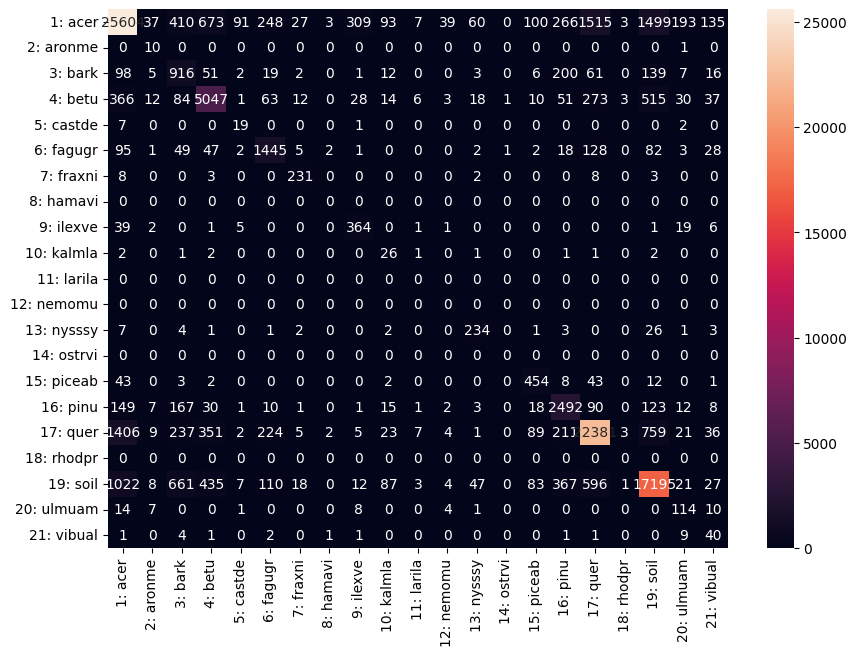

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
plt.figure(figsize = (10,7))
classes = ['1: acer', '2: aronme', '3: bark', '4: betu', '5: castde',
           '6: fagugr', '7: fraxni', '8: hamavi', '9: ilexve','10: kalmla', '11: larila',
          '12: nemomu', '13: nysssy', '14: ostrvi', '15: piceab', '16: pinu',
          '17: quer', '18: rhodpr', '19: soil', '20: ulmuam', '21: vibual'
          ]

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))


df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

<ipython-input-38-21d89ee3a9f1>:12: RuntimeWarning:

invalid value encountered in true_divide



{'18: rhodpr', '11: larila', '12: nemomu', '8: hamavi', '14: ostrvi'}


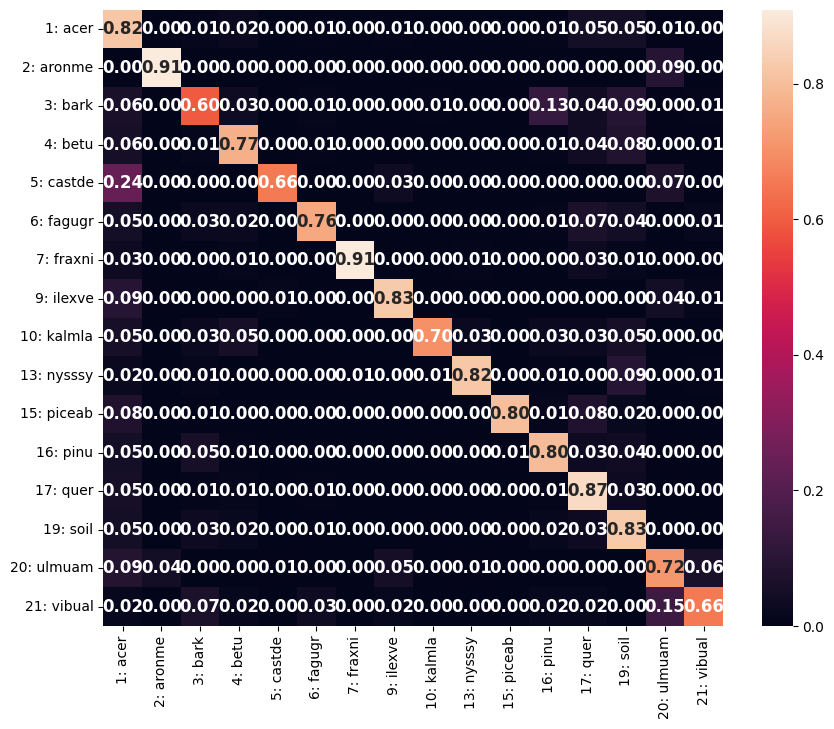

In [ ]:

import seaborn as sns
from sklearn.metrics import confusion_matrix
plt.figure(figsize = (10,8))
classes = ['1: acer', '2: aronme', '3: bark', '4: betu', '5: castde',
           '6: fagugr', '7: fraxni', '8: hamavi', '9: ilexve','10: kalmla', '11: larila',
          '12: nemomu', '13: nysssy', '14: ostrvi', '15: piceab', '16: pinu',
          '17: quer', '18: rhodpr', '19: soil', '20: ulmuam', '21: vibual'
          ]

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))
# Normalise
cmn = mat.astype('float') / mat.sum(axis=1)[:, np.newaxis]

df_cm = pd.DataFrame(cmn, index = classes, columns = classes)

# # Default drop rows that contains nan values
df2=df_cm.dropna()
#print(df2)

#print(df2.columns.tolist())
# Get the list of index names
index_names = df2.index.tolist()
# Get the list of column names
column_names = df2.columns.tolist()
# Find the set intersection of the two lists
# unique_names = set(index_names).intersection(column_names)
# # Print the unique names
# print(unique_names)
# find the set difference between the two lists
names_diff = set(column_names)-set(index_names)

# print the result
print(names_diff)
df2=df2.drop(columns=names_diff)

#sns.set(font_scale=1.2)
#sns.heatmap(df2, annot=True, fmt='.2f')
sns.heatmap(df2, annot=True, annot_kws={"size":12, "weight": "bold"},fmt='.2f')

plt.show()

# from sklearn.metrics import confusion_matrix
# import seaborn as sns

# cm = confusion_matrix(y_test, y_pred)
# # Normalise
# cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
# fig, ax = plt.subplots(figsize=(10,10))
# sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=target_names, yticklabels=target_names)
# plt.ylabel('Actual')
# plt.xlabel('Predicted')
# plt.show(block=False)

<ipython-input-53-4255ac49e396>:12: RuntimeWarning:

invalid value encountered in true_divide



{'larila', 'nemomu', 'hamavi', 'ostrvi', 'rhodpr'}


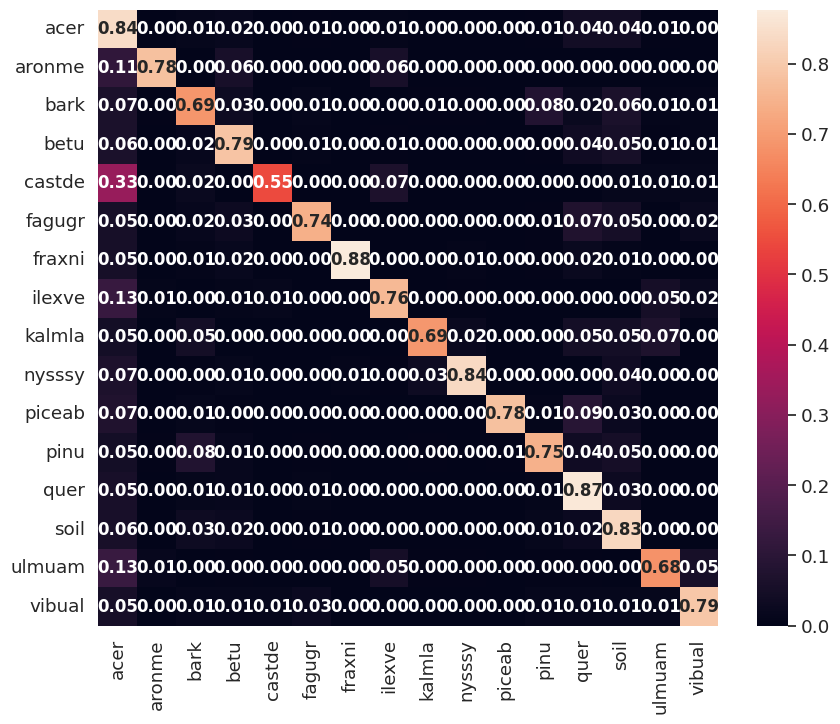

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
plt.figure(figsize = (10,8))
classes = ['acer', 'aronme', 'bark', 'betu', 'castde',
           'fagugr', 'fraxni', 'hamavi', 'ilexve','kalmla', 'larila',
          'nemomu', 'nysssy', 'ostrvi', 'piceab', 'pinu',
          'quer', 'rhodpr', 'soil', 'ulmuam', 'vibual'
          ]

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))
# Normalise
cmn = mat.astype('float') / mat.sum(axis=1)[:, np.newaxis]

df_cm = pd.DataFrame(cmn, index = classes, columns = classes)

# # Default drop rows that contains nan values
df2=df_cm.dropna()
#print(df2)

#print(df2.columns.tolist())
# Get the list of index names
index_names = df2.index.tolist()
# Get the list of column names
column_names = df2.columns.tolist()
# Find the set intersection of the two lists
# unique_names = set(index_names).intersection(column_names)
# # Print the unique names
# print(unique_names)
# find the set difference between the two lists
names_diff = set(column_names)-set(index_names)

# print the result
print(names_diff)
df2=df2.drop(columns=names_diff)

sns.set(font_scale=1.2)
#sns.heatmap(df2, annot=True, fmt='.2f')
sns.heatmap(df2, annot=True, annot_kws={"size":12, "weight": "bold"},fmt='.2f')

plt.show()


In [ ]:


l = [] #This line initializes an empty list l which will be used to store the predicted class labels.

for i in range(df.shape[0]):
  if df.iloc[i, -1] == 0: #This condition checks if the last column of the current row in the DataFrame df is equal to zero.
    l.append(0)
  else:
    l.append(np.argmax(model.predict(df.iloc[i, :-1].values.reshape(1,-1, 1)), 1))
q = np.array(l).reshape(labelArray.shape).astype('float') #After the loop, it converts the list l to a NumPy array, reshapes it to match the shape of labelArray, and converts the data type to float.


In [ ]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='jet')
  plt.colorbar()
  plt.axis('off')
  plt.show()

plot_data(q)